# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в анализ данных" </center>

# <center> Лабораторная работа №2. Кластерный анализ. </center>

## Задание 1

В данном задании вам необходимо реализовать алгоритм кластеризации [Partition Around Medoids](http://algowiki-project.org/ru/%D0%A3%D1%87%D0%B0%D1%81%D1%82%D0%BD%D0%B8%D0%BA:Denemmy/Partitioning_Around_Medoids_%28%D0%90%D0%BB%D0%B3%D0%BE%D1%80%D0%B8%D1%82%D0%BC%29).  
  
Два возможных варианта реализации:  
  
### Функция
  
Нужно написать функцию, которая принимает на вход несколько параметров и возвращает также несколько значений.  
  
Параметры функции:
- **data:** данные в виде dataframe или матрицы (аналогично функциям и методам, которые рассматривали на практике);
- **k:** число центров (кластеров);
- **metric:** расстояние между объектами (те же, что поддерживает функция `pdist()`);
- **max_iter:** максимальное число итераций;  
- **tol:** минимальное значение изменения целевой функции.

Возвращаемые значения:  
- **inertia:** итоговое значение целевой функции;
- **medoids:** центры кластеров - индексы объектов данных, которые являются центрами;
- **labels:** метки кластеров для каждого объекта.
  
### Класс  
  
По аналогии с классами в scikit-learn, нужно реализовать класс, наследуемый от [Base Estimator](https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html).  
Подробнее про реализацию своих моделей в scikit-learn: [here](https://scikit-learn.org/stable/developers/develop.html#rolling-your-own-estimator).
  
Параметры: 
- **k:** число центров (кластеров);
- **metric:** расстояние между объектами (те же, что поддерживает функция `pdist()`);
- **max_iter:** максимальное число итераций;  
- **tol:** минимальное значение изменения целевой функции.  
  
Методы:  
- **fit():** метод для выполнения кластеризации.  
    Аргументы метода:  
    - **data:** данные в виде dataframe или матрицы
  
Атрибуты:  
- **inertia_:** итоговое значение целевой функции;
- **medoids_:** центры кластеров - индексы объектов данных, которые являются центрами;
- **labels_:** метки кластеров для каждого объекта.  
   
<br>  
**Note 1:** Параметры `max_iter` и `tol` должны иметь дефолтные значения.  
**Note 2:** Функции для вычисления расстояний самим реализовывать не нужно, используйте `pdist()`.  
  
<br>  
Также необходимо написать документацию к функции/методу: описать формат входных данных (параметров) и возвращаемых значений, особенности работы функции и детали реализации алгоритма. В качестве образца можно взять документацию к функциям/методам, которые рассматривали на занятиях.  
  
Наивная реализация алгоритма будет работать довольно медленно - это нормально. Будет плюсом (но не является обязательным), если вы попытаетесь оптимизировать ваш код. Можете указать все ваши решения для оптимизации в документации.   

In [1]:
import pandas as pd
import numpy as np

from scipy.spatial.distance import cdist
from sklearn.base import TransformerMixin, ClusterMixin, BaseEstimator

import matplotlib.pyplot as plt
import seaborn as sns

In [44]:
def kmedoids_init(X, n_clusters, method='balanced', rng=None):

    n_samples = X.shape[0]
    
    if rng is None:
        cent_idx = np.random.choice(n_samples, replace=False, size=n_clusters)
    else:
        cent_idx = rng.choice(n_samples, replace=False, size=n_clusters)
    
    centers = X[cent_idx, :]
    mean_X = np.mean(X, axis=0)
    
    if method == 'balanced':
        centers[n_clusters - 1] = n_clusters * mean_X - np.sum(centers[:(n_clusters - 1)], axis=0)
    
    return centers

def assign_clusters(X, centers):

    dist2cents = cdist(X, centers, metric='seuclidean')
    membs = np.argmin(dist2cents, axis=1)

    return membs

def update_centers(X, membs, n_clusters, distance):

    centers = np.empty(shape=(n_clusters, X.shape[1]), dtype=float)
    sse = np.empty(shape=n_clusters, dtype=float)
    
    for clust_id in range(n_clusters):
        memb_ids = np.where(membs == clust_id)[0]
        X_clust = X[memb_ids, :]

        dist = np.empty(shape=memb_ids.shape[0], dtype=float)
        
        for i, x in enumerate(X_clust):
            dist[i] = np.sum(cdist(X_clust, np.array([x]), distance))

        inx_min = np.argmin(dist)
        centers[clust_id, :] = X_clust[inx_min, :]
        sse[clust_id] = dist[inx_min]
            
    return centers, sse

def kmedoids_trial(X, n_clusters, distance, max_iter, tol, rng):

    membs = np.empty(shape=X.shape[0], dtype=int)
    centers = kmedoids_init(X, n_clusters, method='', rng=rng)

    sse_last = 9999.9
    n_iter = 0
        
    for it in range(1, max_iter):
        membs = assign_clusters(X, centers)
        centers, sse_arr = update_centers(X, membs, n_clusters, distance)
        sse_total = np.sum(sse_arr)
        
        if np.abs(sse_total - sse_last) < tol:
            n_iter = it
            break
            
        sse_last = sse_total

    return centers, membs, sse_total, sse_arr, n_iter
    
def kmedoids(X, n_clusters, distance, max_iter, n_trials, tol, rng):
    
    n_samples, n_features = X.shape[0], X.shape[1]

    centers_best = np.empty(shape=(n_clusters,n_features), dtype=float)
    labels_best  = np.empty(shape=n_samples, dtype=int)
    
    for i in range(n_trials):
        centers, labels, sse_tot, sse_arr, n_iter  =  kmedoids_trial(X, n_clusters, distance, max_iter, tol, rng)
        
        if i == 0:
            sse_tot_best = sse_tot
            sse_arr_best = sse_arr
            n_iter_best = n_iter
            centers_best = centers.copy()
            labels_best  = labels.copy()
        
        if sse_tot < sse_tot_best:
            sse_tot_best = sse_tot
            sse_arr_best = sse_arr
            n_iter_best = n_iter
            centers_best = centers.copy()
            labels_best  = labels.copy()

    return centers_best, labels_best, sse_arr_best, n_iter_best

class KMedoids(TransformerMixin, ClusterMixin, BaseEstimator):
    
    def __init__(self, n_clusters=2, distance='euclidean', 
                 n_trials=10, max_iter=100, tol=0.001, random_state=None):
        
        self.n_clusters = n_clusters
        self.n_trials = n_trials
        self.max_iter = max_iter
        self.tol = tol
        self.distance = distance
        self.random_state = random_state
        self.rng = np.random.RandomState(random_state)

    def fit(self, X):
        X = X.to_numpy()
        self.centers_, self.labels_, self.sse_arr_, self.n_iter_ = kmedoids(X, self.n_clusters, self.distance, self.max_iter, self.n_trials, self.tol, self.rng)

|Параметр|Тип данных|Дефолтное значение|Расшифровка|
|-----|-------|------|------|
|**n_clusters**|int|2|Количество формируемых кластеров, а также количество медоидов для генерации|
|**distance**|str|euclidean|Метрика для измерения расстояния (близости) объектов|
|**n_trials**|int|10|Количество случайных инициализаций медоидов|
|**max_iter**|int|100|Максимальное количество итераций|
|**tol**|int|0.001|Идентификатор для остановки относительных изменений центра|
|**random_state**|int or None|None|Определяет генерацию случайного числа для инициализации медоида и случайного переназначения|

**Входные данные:**
<blockquote>
    При обучении модели (использовании метода fit), входными данными будут являться: непосредственно датафрейм и заданные параметры (пользовательские или дефолтные). Для удобства работы с данными, DataFrame переводится в двумерный массив NumPy.
</blockquote>
<br>

**Функция kmedoids:**
<blockquote>
    Проводит несколько испытаний (через функцию kmedoids_trial) кластеризации k-medoids, на выходе получает оптимальные центры и метки кластера.
</blockquote>
<br>

**Функция kmedoids_trial:**
<blockquote>
    Рандомно инициализирует k (число медоидов). Проводит одно пробное испытание кластеризации k-medoids на наборе входных данных X и заданном количестве кластеров.
</blockquote>
<br>

**Функция update_centers:**
<blockquote>
    Обновление центров кластеров (медоидов). Ассоциация каждой точки из набора данных с ближайшим медоидом (через функцию assign_clusters, с использованием функции cdist(), вычисляющей расстояние между каждой парой из двух наборов входных данных).
</blockquote>
<br>

**Возвращаемые данные:**

|Атрибут|Тип данных|Расшифровка|
|-----|-------|------|
|**centers_**|ndarray|Центры кластеров|
|**labels_**|ndarray|Метки кластера для каждого элемента данных|
|**sse_arr_**|ndarray|Массив показателей, насколько далеки прогнозы модели от наблюдаемых значений для каждого кластера|
|**n_iter_**|int|Количество пройденных итераций для достижения наилучшего значения целевой функции|

# Задание 2

В рамках данной лабораторной работы вам предлагается проанализировать набор данных по различным городам США. Каждый город характеризуется следующими признаками:

In [3]:
pd.set_option('display.max_rows', 20)
pd.set_option('display.max_colwidth', -1)

In [4]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,Attribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temperature variation, heating- and cooling-degree days, freezing days, zero-degree days, ninety-degree days."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, medical schools, cardiac rehabilitation centers, comprehensive cancer treatment centers, hospices, insurance/hospitalization costs index, flouridation of drinking water, air pollution."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Interstate highways, air service, passenger rail service."
6,Education,"Pupil/teacher ratio in the public K-12 system, effort index in K-12, accademic options in higher education."
7,The Arts,"Museums, fine arts and public radio stations, public television stations, universities offering a degree or degrees in the arts, symphony orchestras, theatres, opera companies, dance companies, public libraries."
8,Recreation,"Good restaurants, public golf courses, certified lanes for tenpin bowling, movie theatres, zoos, aquariums, family theme parks, sanctioned automobile race tracks, pari-mutuel betting attractions, major- and minor- league professional sports teams, NCAA Division I football and basketball teams, miles of ocean or Great Lakes coastline, inland water, national forests, national parks, or national wildlife refuges, Consolidated Metropolitan Statistical Area access."
9,Economics,"Average household income adjusted for taxes and living costs, income growth, job growth."


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

In [2]:
data = pd.read_csv('Data.txt', sep=' ')
data

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.55900,110932
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.08500,660328
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.57500,112402
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.73270,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.08300,419700
5,"Alexandria,LA",520,5819,640,727,2444,2972,334,1018,5254,-92.4530,31.30200,135282
6,"Allentown,Bethlehem,PA-NJ",559,8288,621,514,2881,3144,2333,1117,5097,-75.4405,40.61550,635481
7,"Alton,Granite-City,IL",537,6487,965,706,4975,2945,1487,1280,5795,-90.1615,38.79400,268229
8,"Altoona,PA",561,6191,432,399,4246,2778,256,1210,4230,-78.3950,40.51500,136621
9,"Amarillo,TX",609,6546,669,1073,4902,2852,1235,1109,6241,-101.8490,35.38300,173699


<br>  
### Задания: 

&nbsp;&nbsp;&nbsp;0. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки `Place`, `Long` и `Lat`.

1. Выполните кластеризацию иерархическим методом.  
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.  
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы.  
<br>  
2. Выполните кластеризацию методом dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.  
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.  
<br>  
3. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.  
<br>  
4. Выполните кластеризацию методом PAM. Используйте расстояния между объектами, определенные в пункте (1). Определите наилучшее (на ваш взгляд) число кластеров.  
Используйте реализацию алгоритма из Задания 1.  
<br>  
5. (Бонусное) Выполните кластеризацию другими методами. Например, [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) или алгоритмы, [реализованные](https://scikit-learn.org/stable/modules/clustering.html) в scikit-learn.  
<br>  
6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиения объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.  
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).  
<br>  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  
<br>  
8. Оцените, как полученные кластеры распределены географически. (Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?

**Задание 0.**

**Comment:** *Скопируем исходную таблицу для того чтобы в последствии было возможно видоизменять её без риска потери исходных данных.*

In [3]:
data_new = data.copy(deep=True)
data_new.drop(data.columns[[0, 10, 11]], axis='columns', inplace=True)
data_new.head(15)

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,521,6200,237,923,4031,2757,996,1405,7633,110932
1,575,8138,1656,886,4883,2438,5564,2632,4350,660328
2,468,7339,618,970,2531,2560,237,859,5250,112402
3,476,7908,1431,610,6883,3399,4655,1617,5864,835880
4,659,8393,1853,1483,6558,3026,4496,2612,5727,419700
5,520,5819,640,727,2444,2972,334,1018,5254,135282
6,559,8288,621,514,2881,3144,2333,1117,5097,635481
7,537,6487,965,706,4975,2945,1487,1280,5795,268229
8,561,6191,432,399,4246,2778,256,1210,4230,136621
9,609,6546,669,1073,4902,2852,1235,1109,6241,173699


In [7]:
data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329 entries, 0 to 328
Data columns (total 10 columns):
Climate        329 non-null int64
HousingCost    329 non-null int64
HlthCare       329 non-null int64
Crime          329 non-null int64
Transp         329 non-null int64
Educ           329 non-null int64
Arts           329 non-null int64
Recreat        329 non-null int64
Econ           329 non-null int64
Pop            329 non-null int64
dtypes: int64(10)
memory usage: 25.8 KB


**Comment:** *Выполним нормализацию данных.*

In [8]:
from sklearn import preprocessing

In [9]:
data_norm = preprocessing.normalize(data_new, norm='l2', axis=0)
data_norm

array([[0.05202887, 0.0393812 , 0.00841857, ..., 0.03845108, 0.07473997,
        0.0059174 ],
       [0.0574215 , 0.051691  , 0.05882341, ..., 0.07203078, 0.04259385,
        0.03522362],
       [0.04673611, 0.0466159 , 0.02195221, ..., 0.02350852, 0.05140637,
        0.00599582],
       ...,
       [0.05392628, 0.05317097, 0.02532674, ..., 0.02304328, 0.0484297 ,
        0.02033714],
       [0.05692218, 0.04459603, 0.03896695, ..., 0.03631643, 0.03812884,
        0.0283436 ],
       [0.06071699, 0.05002047, 0.00753053, ..., 0.0251232 , 0.04596219,
        0.00543983]])

In [10]:
data_norm = pd.DataFrame(data_norm, columns=list(data_new))
data_norm.head(15)

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,0.052029,0.039381,0.008419,0.049641,0.049913,0.053652,0.009797,0.038451,0.074740,0.005917
1,0.057421,0.051691,0.058823,0.047651,0.060463,0.047444,0.054731,0.072031,0.042594,0.035224
2,0.046736,0.046616,0.021952,0.052169,0.031340,0.049818,0.002331,0.023509,0.051406,0.005996
3,0.047535,0.050230,0.050831,0.032807,0.085228,0.066145,0.045789,0.044253,0.057418,0.044588
4,0.065810,0.053311,0.065821,0.079760,0.081203,0.058887,0.044225,0.071483,0.056077,0.022388
5,0.051929,0.036961,0.022734,0.039100,0.030262,0.057836,0.003285,0.027860,0.051446,0.007216
6,0.055824,0.052644,0.022059,0.027644,0.035674,0.061183,0.022949,0.030569,0.049908,0.033898
7,0.053627,0.041204,0.034278,0.037971,0.061602,0.057310,0.014627,0.035030,0.056743,0.014308
8,0.056023,0.039324,0.015345,0.021459,0.052575,0.054060,0.002518,0.033114,0.041419,0.007288
9,0.060817,0.041579,0.023764,0.057709,0.060698,0.055501,0.012148,0.030350,0.061110,0.009266


**Задание 1.**

Выполните кластеризацию иерархическим методом.
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации. 
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы. 

In [11]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist

**Comment:** *У pdist очень много метрик, но я не поняла, как вывести их список, поэтому сделала вручную.*

In [12]:
dist = {'braycurtis': pdist(data_norm, 'braycurtis'),
        'canberra': pdist(data_norm, 'canberra'),
        'chebyshev': pdist(data_norm, 'chebyshev'),
        'cityblock': pdist(data_norm, 'cityblock'),
        'correlation': pdist(data_norm, 'correlation'),
        'cosine': pdist(data_norm, 'cosine'),
        'euclidean': pdist(data_norm, 'euclidean'),
        'hamming': pdist(data_norm, 'hamming'),
        'jaccard': pdist(data_norm, 'jaccard'),
        'jensenshannon': pdist(data_norm, 'jensenshannon'),
        'mahalanobis': pdist(data_norm, 'mahalanobis'),
        'minkowski': pdist(data_norm, 'minkowski'),
        'seuclidean': pdist(data_norm, 'seuclidean'),
        'sqeuclidean': pdist(data_norm, 'sqeuclidean')}

In [13]:
DistFrame = pd.DataFrame(dist)
DistFrame.shape

(53956, 14)

**Comment:** *Матрица корреляции поможет выяснить, какие метрики явно выбиваются из общего списка (наименее схожи с остальными).*

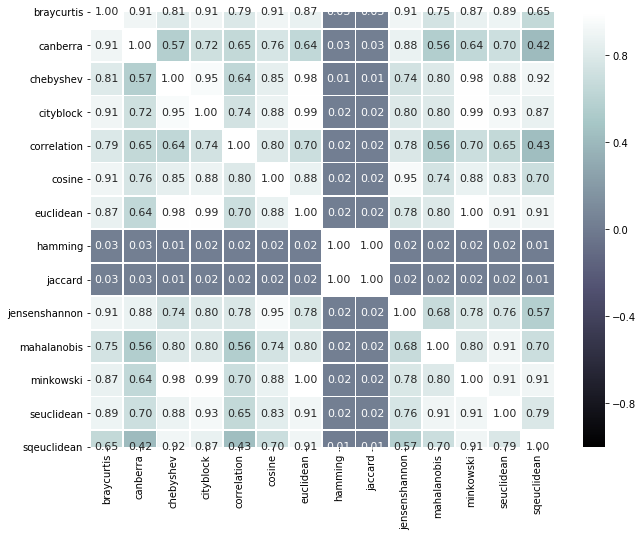

In [14]:
plt.figure(figsize=(10.4, 8))
sns.heatmap(DistFrame.corr(), 
            cmap=sns.color_palette('bone', 1000),
            fmt='.2f',
            vmin=-1,
            center=0,
            annot=True,
            annot_kws={'size': 11},
            linewidths=.75)
plt.show()

**Comment:** *В ходе предыдущего пункта сразу исключили **'hamming'** и **'jaccard'**, так как расстояния, которые были вычислены при помощи данных метрик, были наименее схожи с остальными.*

**Comment:** *Посмотрим, каким образом будет выполняться иерархическая кластеризация, выполненная при помощи различных **метрик** и **методов** для расчёта расстояний, построим дендрограммы.*

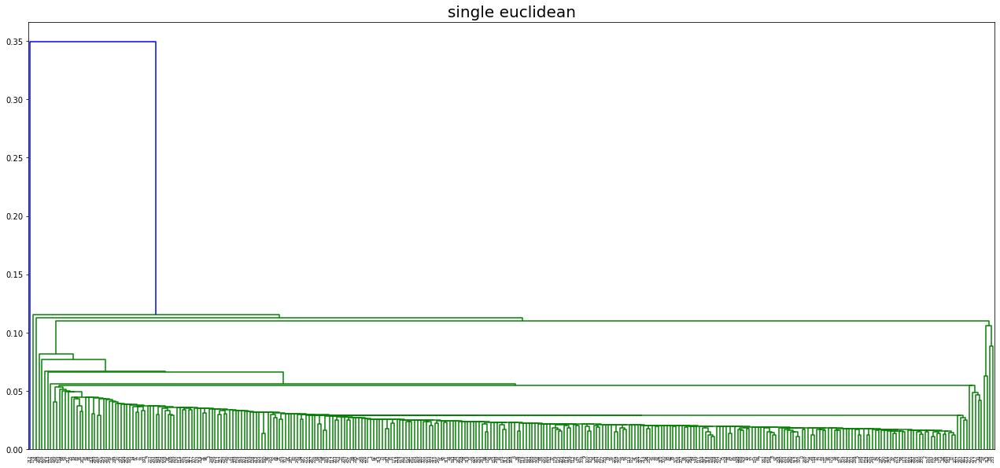

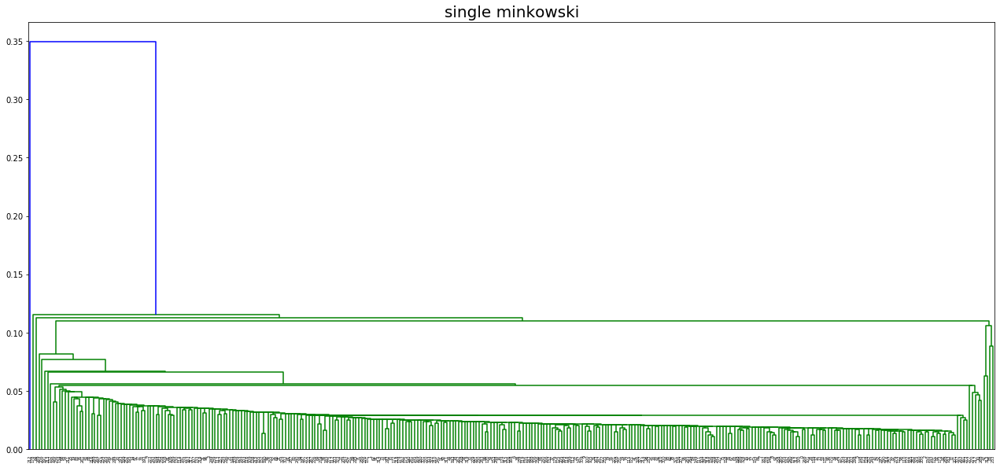

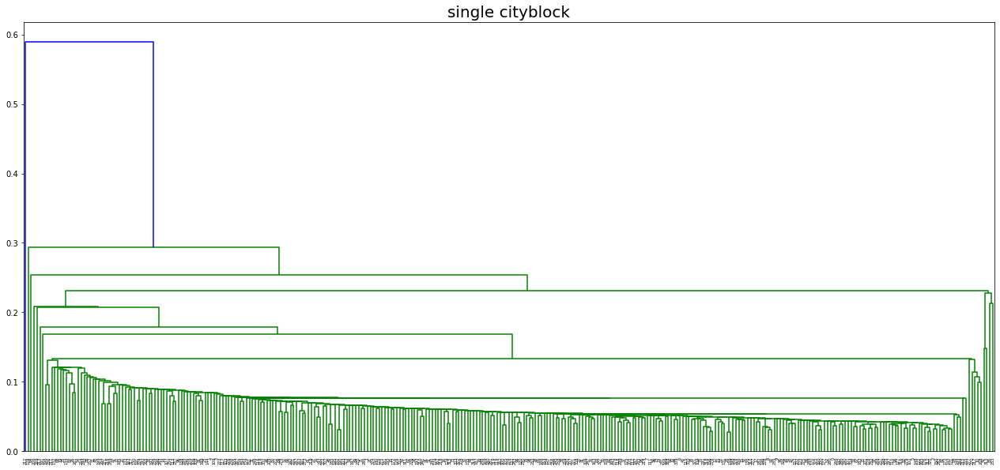

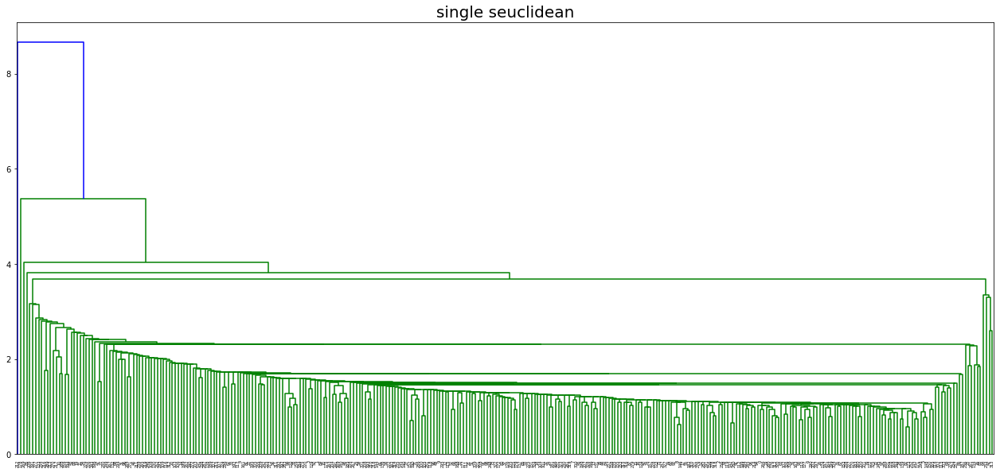

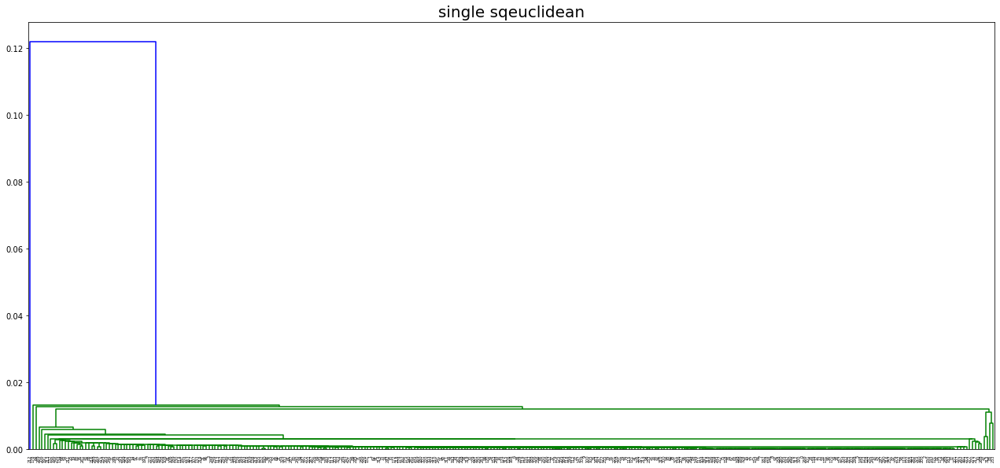

...

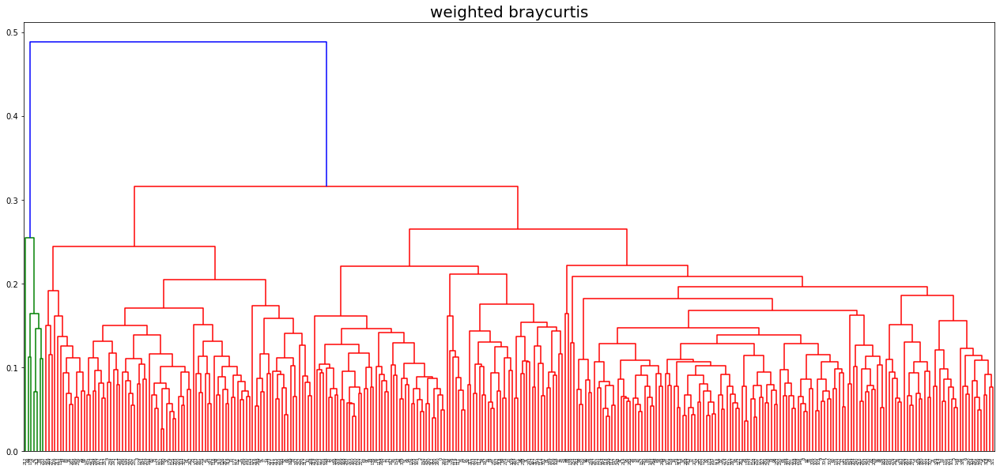

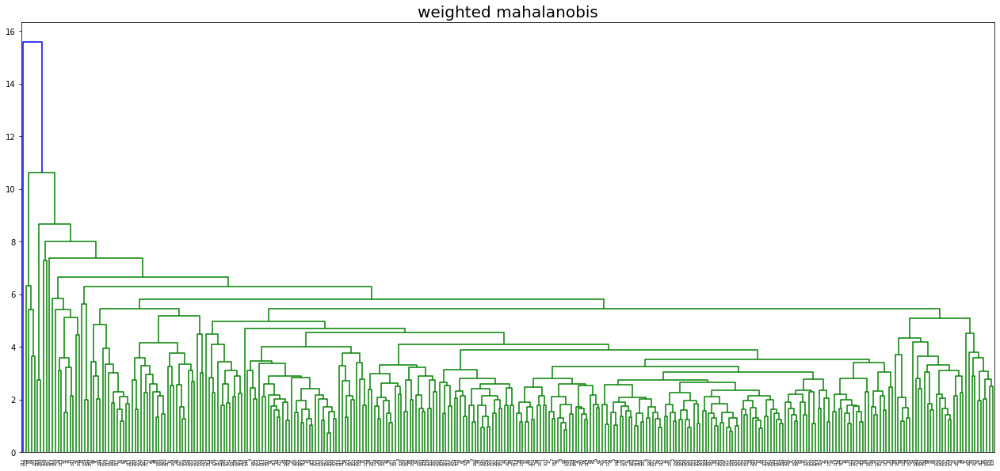

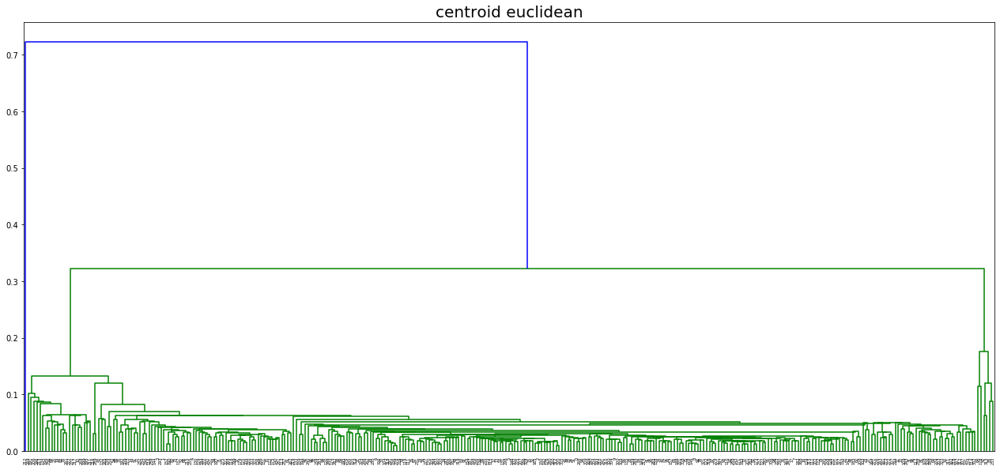

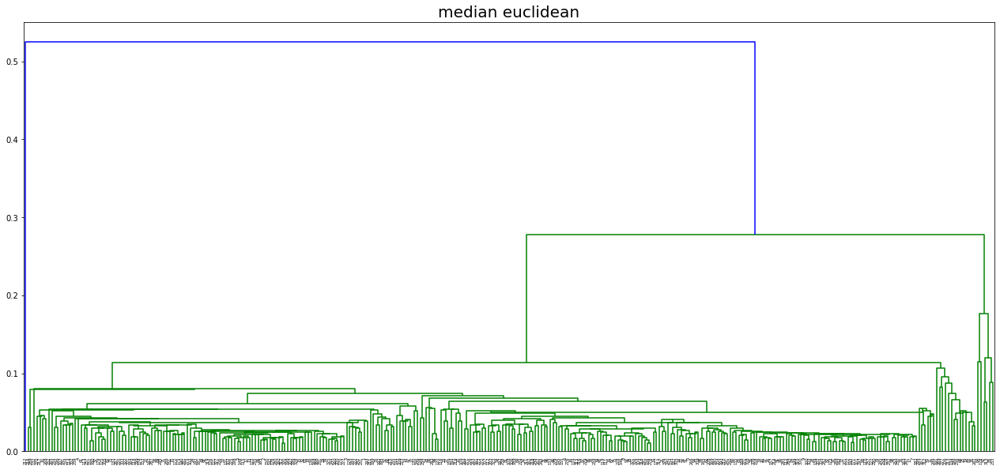

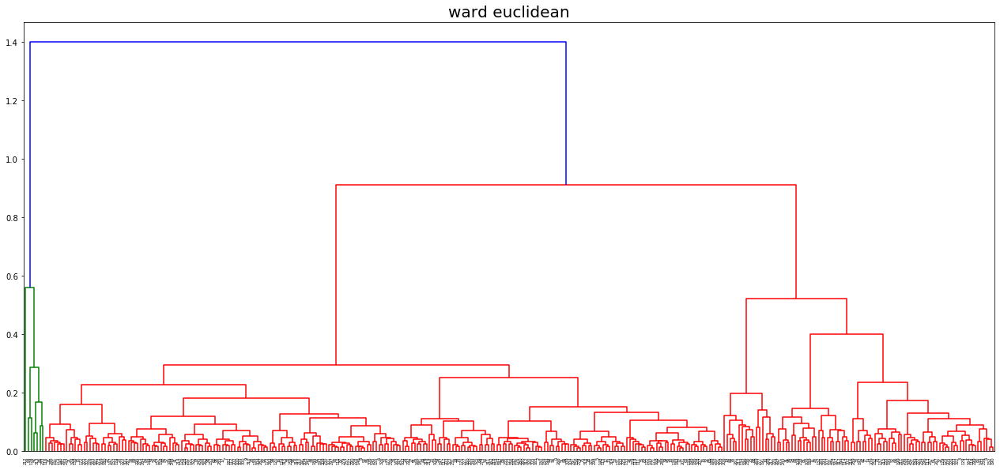

In [15]:
samples = data_norm.values

metrics = ['euclidean','minkowski', 'cityblock', 'seuclidean', 
           'sqeuclidean','cosine', 'correlation', 'chebyshev', 
           'canberra', 'braycurtis', 'mahalanobis']

methods = ['single', 'complete', 'average', 'weighted', 
           'centroid', 'median', 'ward']

for method in methods:
    if method in ('centroid', 'median', 'ward'):
        metric = 'euclidean'
        plt.figure(figsize=(22, 10))
        mergings = linkage(samples, method=method, metric=metric)
        dendrogram(mergings)
        plt.title('{} {}'.format(method, metric), size=20)
        plt.show()
    else:
        for metric in metrics:
            plt.figure(figsize=(22, 10))
            mergings = linkage(samples, method=method, metric=metric)
            dendrogram(mergings)
            plt.title('{} {}'.format(method, metric), size=20)
            plt.show()

**Comment:** *Удачнее всего выполнилась кластеризация при помощи метрик **canberra**, **correlation**, **braycurtis** в сочетании с методами **complete** и **weighted** (для первых двух) - кластеры легко читаются, их число варьируется от 4 до 8, что поможет более детально рассмотреть разбиение и оценить полученные кластеры.*

In [16]:
from scipy.cluster.hierarchy import fcluster

In [17]:
cl_hierarchy_com_cor = linkage(samples, method='complete', metric='correlation')
cl_hierarchy_com_canb = linkage(samples, method='complete', metric='canberra')
cl_hierarchy_com_bray = linkage(samples, method='complete', metric='braycurtis')
cl_hierarchy_w_cor = linkage(samples, method='weighted', metric='correlation')
cl_hierarchy_w_can = linkage(samples, method='weighted', metric='canberra')

In [18]:
data_hierarchy = data_norm.copy(deep=True)

**Comment:** *Визуально оценим кластерное распределение. Разбиение возьмем по максимальному количеству кластеров, который для каждой метрики был получен ранее.*

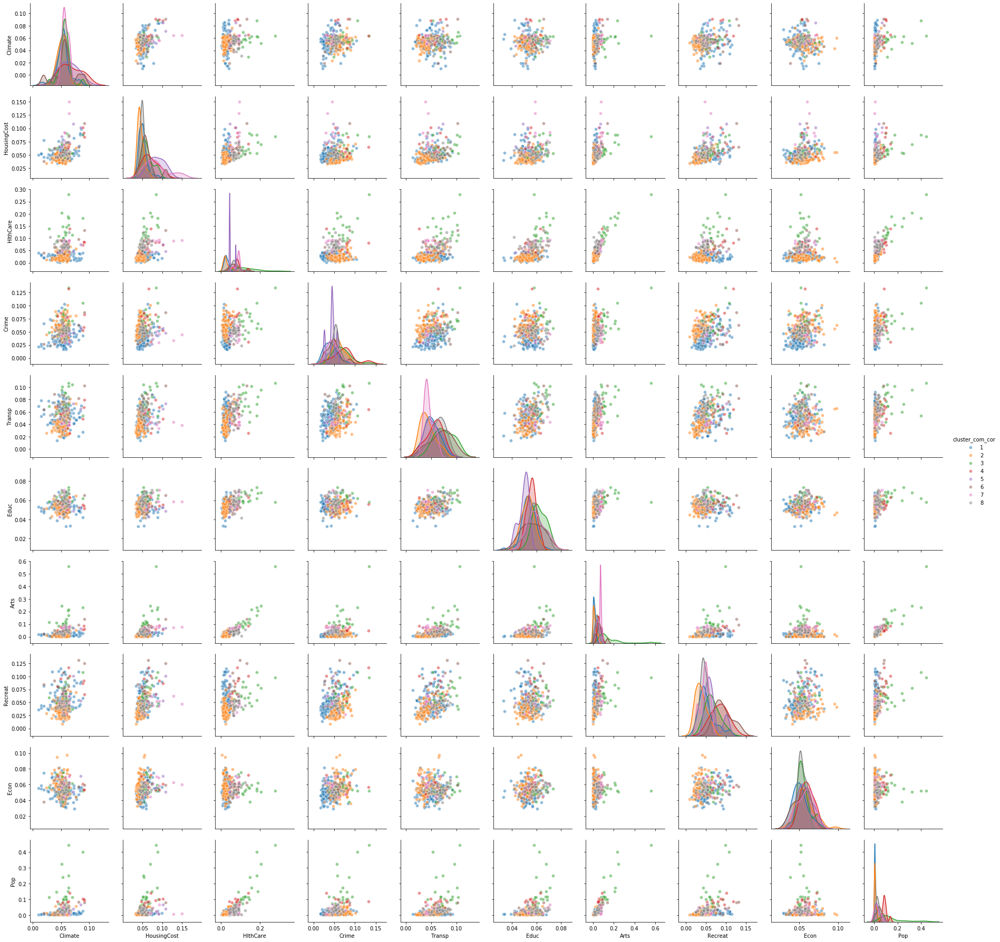

In [19]:
data_hierarchy['cluster_com_cor'] = fcluster(cl_hierarchy_com_cor, t=8, criterion='maxclust')
sns.pairplot(data_hierarchy, 
             hue='cluster_com_cor', 
             plot_kws={'alpha':0.5}, 
             vars=list(data_new[:10]))
plt.show()

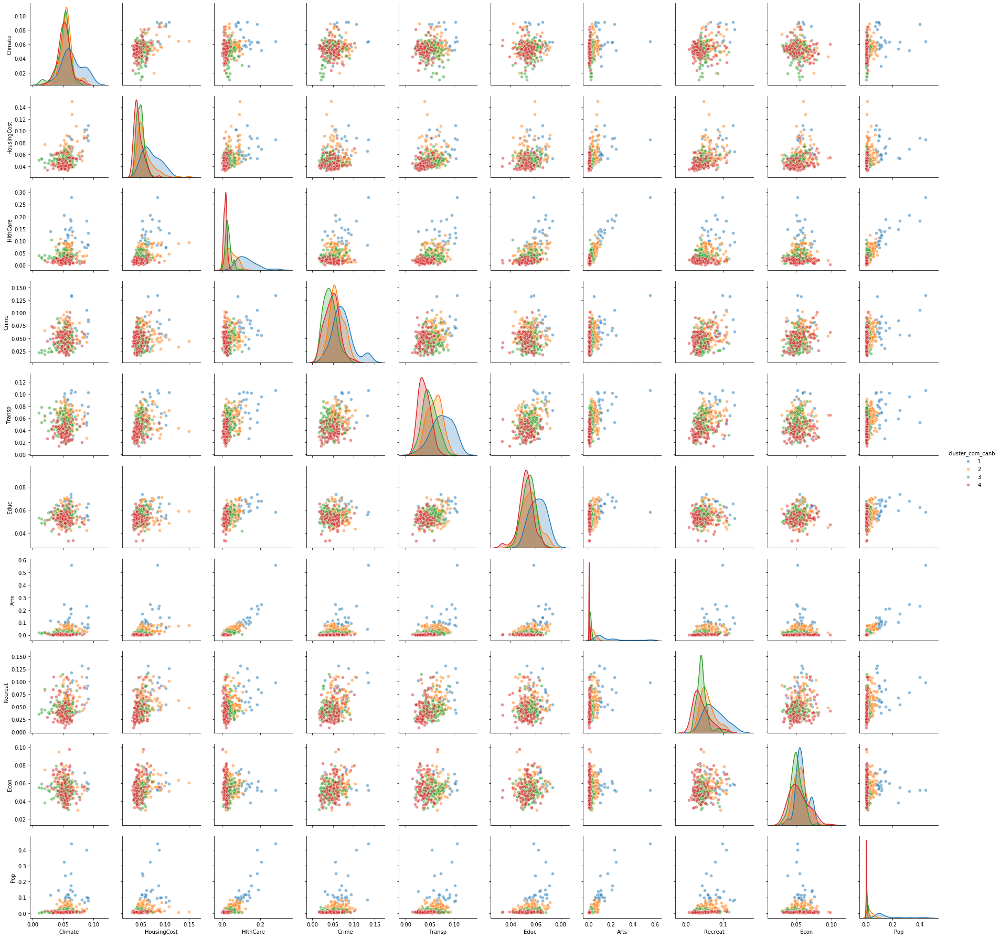

In [20]:
data_hierarchy['cluster_com_canb'] = fcluster(cl_hierarchy_com_canb, t=4, criterion='maxclust')
sns.pairplot(data_hierarchy, 
             hue='cluster_com_canb', 
             plot_kws={'alpha':0.5}, 
             vars=list(data_new[:10]))
plt.show()

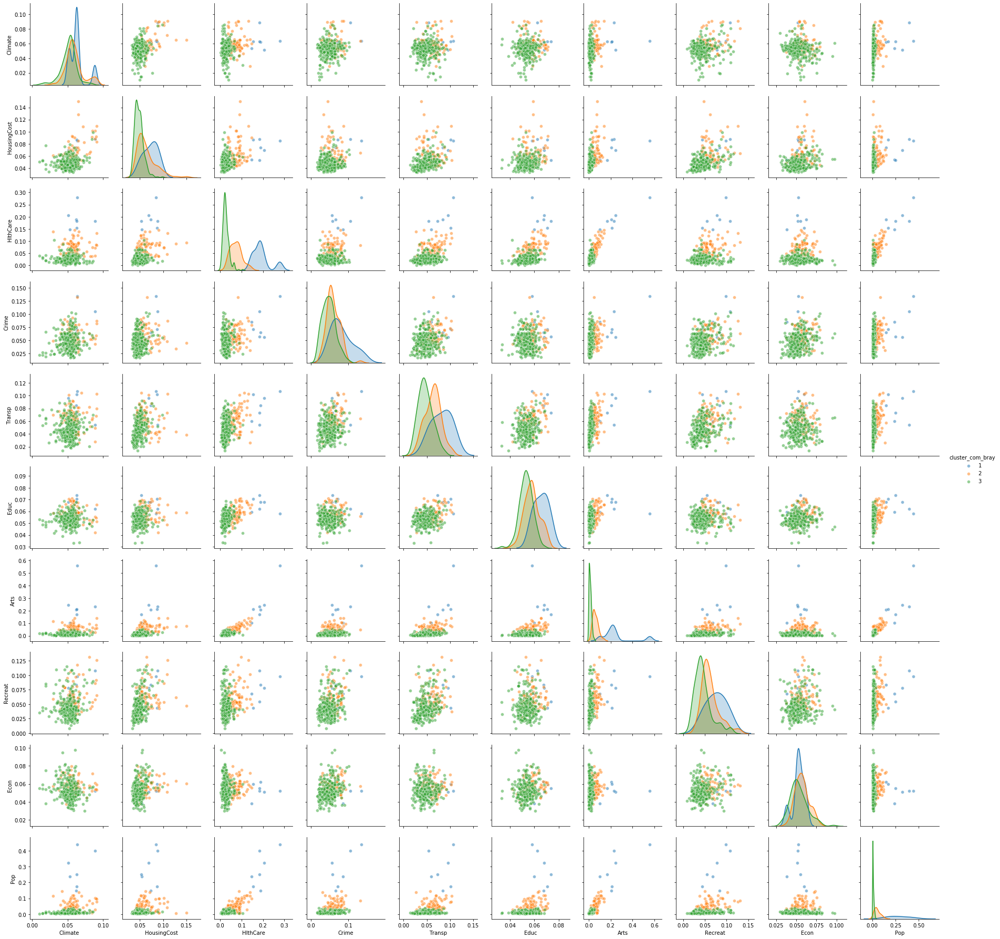

In [21]:
data_hierarchy['cluster_com_bray'] = fcluster(cl_hierarchy_com_bray, t=3, criterion='maxclust')
sns.pairplot(data_hierarchy, 
             hue='cluster_com_bray', 
             plot_kws={'alpha':0.5}, 
             vars=list(data_new[:10]))
plt.show()

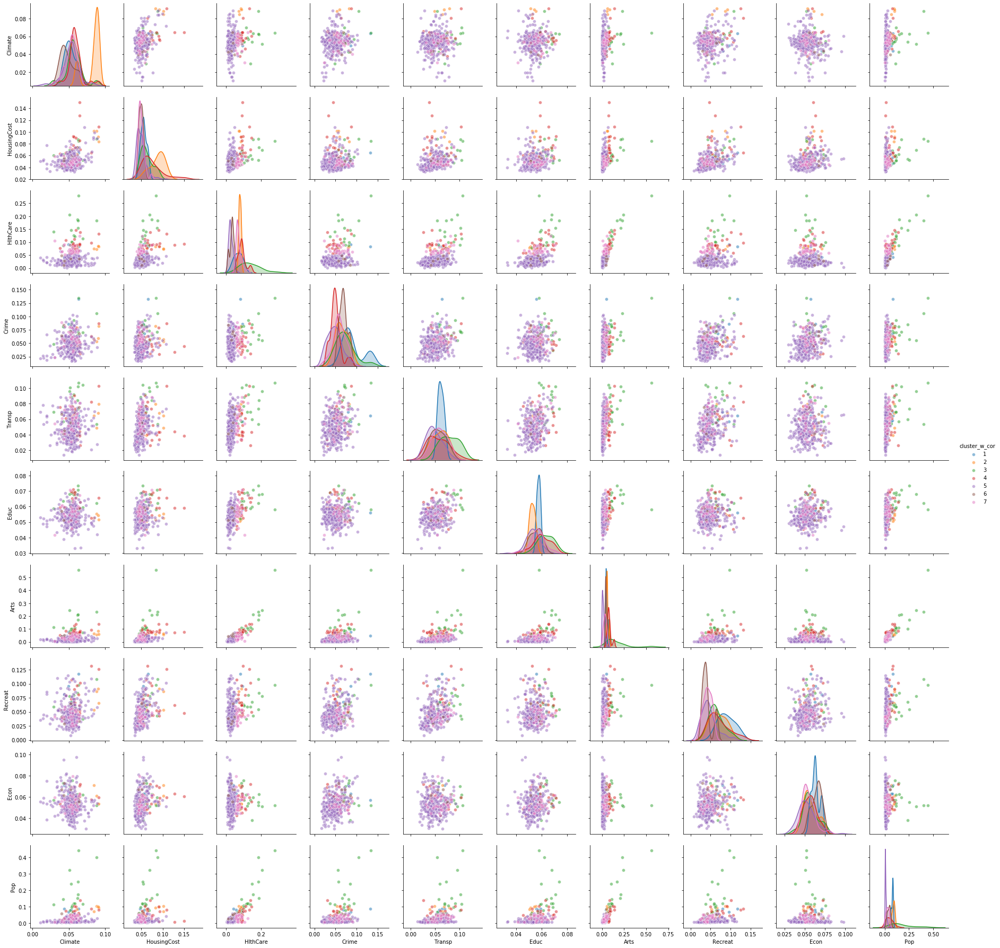

In [22]:
data_hierarchy['cluster_w_cor'] = fcluster(cl_hierarchy_w_cor, t=7, criterion='maxclust')
sns.pairplot(data_hierarchy, 
             hue='cluster_w_cor', 
             plot_kws={'alpha':0.5}, 
             vars=list(data_new[:10]))
plt.show()

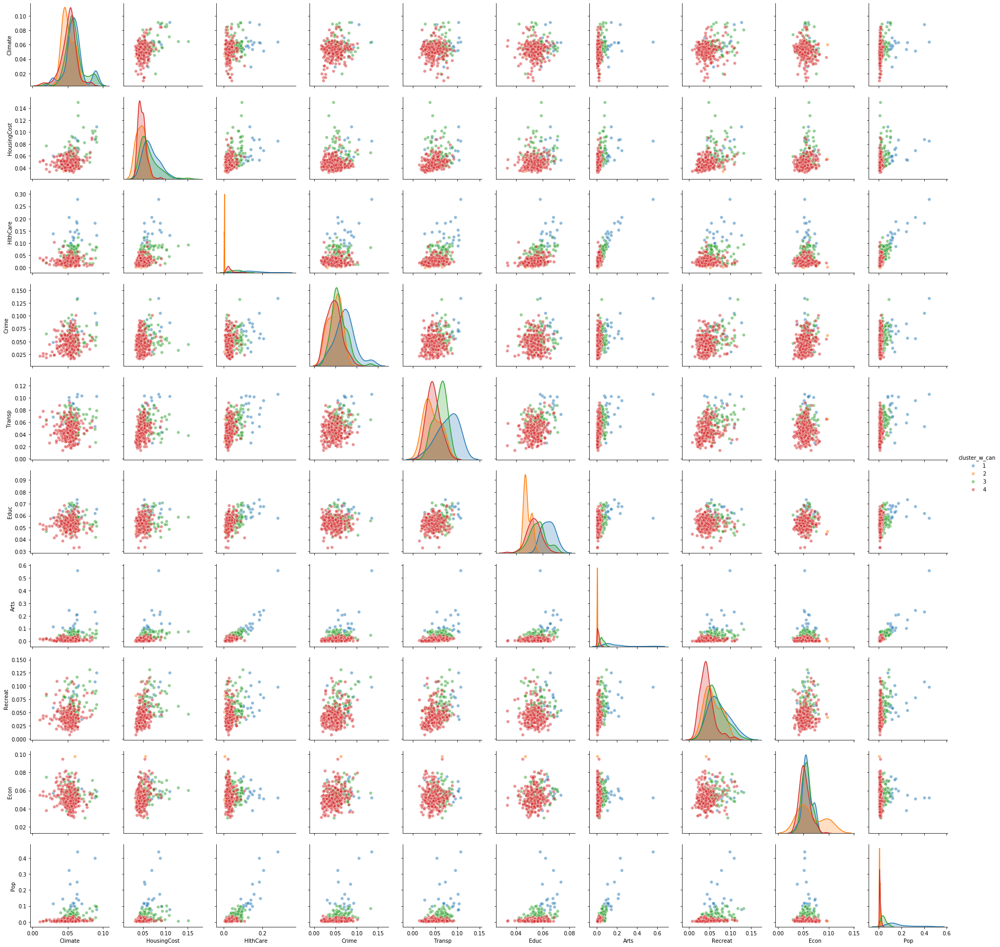

In [23]:
data_hierarchy['cluster_w_can'] = fcluster(cl_hierarchy_w_can, t=4, criterion='maxclust')
sns.pairplot(data_hierarchy, 
             hue='cluster_w_can', 
             plot_kws={'alpha':0.5}, 
             vars=list(data_new[:10]))
plt.show()

**Comment:** *На мой взгляд, более четкое распредление на кластеры достигается при помощи метрики **canberra**. Среди всех остальных вычленить связь очень сложно: кластеры "смешиваются" друг с другом.*

**Задание 2.**

Выполните кластеризацию методом dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.

**Comment:** *Реализуем эвристику с числом ближайших соседей = 5.*

In [24]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [25]:
neigh = NearestNeighbors(n_neighbors=5, metric='canberra')
nbrs = neigh.fit(data_norm)
distances, indices = nbrs.kneighbors(data_norm)

In [26]:
distances = np.mean(distances, axis=1)

In [27]:
distances = np.sort(distances, axis=0)
distances.shape

(329,)

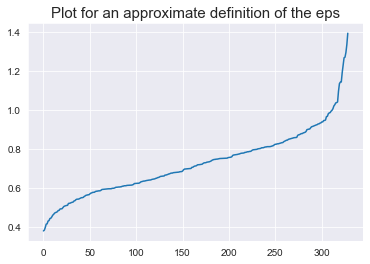

In [28]:
with sns.axes_style('darkgrid'):
    plt.plot(distances)
    plt.title('Plot for an approximate definition of the eps', size=15)
    plt.show()

**Comment:** *Оптимальное значение для выбора **eps** находится в районе **1.2**. Однако протестировав данные параметры непосредственно для определения кластеров, я не получила четкого распределения, наоборот - образовалось огромное количество выбросов.*

**Comment:** *Экспериментальным путём я выяснила, что минимальное количество выбросов достигается при **min_samples=5**, поэтому я попыталась "вручную" подобрать количество кластеров в зависимости от **eps**, а также оценить, сколько объектов попадают в них.*

In [29]:
metrics_dbscan = ['cosine', 'correlation', 'canberra', 'braycurtis', 'cityblock', 'euclidean', 'sqeuclidean']

In [30]:
values_list = []
max_len = 0

for metric in metrics_dbscan:
    cl_dbscan = DBSCAN(eps=0.9, min_samples=5, metric=metric)
    cl_dbscan.fit(data_norm)
    if max_len < len(pd.Series(cl_dbscan.labels_).value_counts().tolist()):
        max_len = len(pd.Series(cl_dbscan.labels_).value_counts().tolist())
    values_list.append([metric] + pd.Series(cl_dbscan.labels_).value_counts().tolist())

pd.DataFrame(values_list, columns=['metric'] + list(np.arange(-1, max_len - 1)))

,metric,-1,0
0,cosine,329,NaN
1,correlation,329,NaN
2,canberra,181,148.0
3,braycurtis,329,NaN
4,cityblock,329,NaN
5,euclidean,329,NaN
6,sqeuclidean,329,NaN


In [31]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 100

def clusters_df(metric):
    max_len = 0
    a = 0.002
    values_list = []

    while a <= 1.5:
        cl_dbscan = DBSCAN(eps=a, min_samples=5, metric=metrics_dbscan[metric])
        cl_dbscan.fit(data_norm)
        values_list.append(['EPS: {:.3f}'.format(a)] + pd.Series(cl_dbscan.labels_).value_counts().tolist())
        if max_len < len(pd.Series(cl_dbscan.labels_).value_counts().tolist()):
            max_len = len(pd.Series(cl_dbscan.labels_).value_counts().tolist())
        a += 0.002
        
    n_table = pd.DataFrame(values_list, columns=[metrics_dbscan[metric]] + list(np.arange(-1, max_len - 1)))
    
    return n_table


eps_values = pd.concat((clusters_df(0), clusters_df(1), clusters_df(2), clusters_df(3),
                        clusters_df(4), clusters_df(5), clusters_df(6)), axis = 1)
eps_values

,cosine,-1,0,1,2,3,4,5,correlation,-1,0,1,2,3,4,5,6,7,8,canberra,-1,0,1,2,3,4,5,braycurtis,-1,0,1,2,3,4,cityblock,-1,0,1,2,euclidean,-1,0,1,sqeuclidean,-1,0,1
0,EPS: 0.002,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.002,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.002,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.002,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.002,329,NaN,NaN,NaN,EPS: 0.002,329,NaN,NaN,EPS: 0.002,295,34.0,NaN
1,EPS: 0.004,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.004,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.004,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.004,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.004,329,NaN,NaN,NaN,EPS: 0.004,329,NaN,NaN,EPS: 0.004,318,11.0,NaN
2,EPS: 0.006,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.006,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.006,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.006,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.006,329,NaN,NaN,NaN,EPS: 0.006,329,NaN,NaN,EPS: 0.006,321,8.0,NaN
3,EPS: 0.008,281,21.0,6.0,6.0,6.0,5.0,4.0,EPS: 0.008,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.008,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.008,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.008,329,NaN,NaN,NaN,EPS: 0.008,329,NaN,NaN,EPS: 0.008,322,7.0,NaN
4,EPS: 0.010,222,68.0,18.0,13.0,4.0,4.0,NaN,EPS: 0.010,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.010,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.010,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.010,329,NaN,NaN,NaN,EPS: 0.010,329,NaN,NaN,EPS: 0.010,322,7.0,NaN
5,EPS: 0.012,172,153.0,4.0,NaN,NaN,NaN,NaN,EPS: 0.012,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.012,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.012,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.012,329,NaN,NaN,NaN,EPS: 0.012,329,NaN,NaN,EPS: 0.012,322,7.0,NaN
6,EPS: 0.014,227,102.0,NaN,NaN,NaN,NaN,NaN,EPS: 0.014,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.014,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.014,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.014,329,NaN,NaN,NaN,EPS: 0.014,329,NaN,NaN,EPS: 0.014,323,4.0,2.0
7,EPS: 0.016,261,63.0,5.0,NaN,NaN,NaN,NaN,EPS: 0.016,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.016,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.016,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.016,329,NaN,NaN,NaN,EPS: 0.016,319,5.0,5.0,EPS: 0.016,327,2.0,NaN
8,EPS: 0.018,278,48.0,3.0,NaN,NaN,NaN,NaN,EPS: 0.018,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.018,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.018,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.018,329,NaN,NaN,NaN,EPS: 0.018,306,13.0,10.0,EPS: 0.018,327,2.0,NaN
9,EPS: 0.020,295,32.0,2.0,NaN,NaN,NaN,NaN,EPS: 0.020,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.020,329,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.020,329,NaN,NaN,NaN,NaN,NaN,EPS: 0.020,329,NaN,NaN,NaN,EPS: 0.020,261,63.0,5.0,EPS: 0.020,327,2.0,NaN


In [32]:
eps_values.describe(include='all')

,cosine,-1,0,1,2,3,4,5,correlation,-1,0,1,2,3,4,5,6,7,8,canberra,-1,0,1,2,3,4,5,braycurtis,-1,0,1,2,3,4,cityblock,-1,0,1,2,euclidean,-1,0,1,sqeuclidean,-1,0,1
count,749,749.000000,16.000000,6.000000,2.000000,2.000000,2.000000,1.0,749,749.000000,191.000000,92.000000,68.000000,11.000000,5.000000,4.000000,4.000000,3.000000,1.0,749,749.000000,473.000000,172.000000,98.000000,44.000000,19.000000,7.0,749,749.000000,63.000000,31.000000,12.000000,4.00,1.0,749,749.000000,274.000000,12.000000,3.000000,749,749.000000,167.000000,9.000000,749,749.000000,60.000000,1.0
unique,749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,749,NaN,NaN,NaN,NaN,NaN,NaN,749,NaN,NaN,NaN,NaN,749,NaN,NaN,NaN,749,NaN,NaN,NaN
top,EPS: 0.946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN,EPS: 0.946,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,1,NaN,NaN,NaN
mean,NaN,328.130841,35.687500,6.333333,9.500000,5.000000,4.500000,4.0,NaN,316.698264,38.073298,15.076087,5.764706,6.181818,6.600000,6.500000,5.000000,4.333333,3.0,NaN,295.588785,48.509514,6.715116,6.214286,4.522727,4.684211,4.0,NaN,326.324433,28.174603,5.225806,4.000000,3.75,4.0,NaN,324.024032,13.281022,6.250000,4.333333,NaN,326.726302,9.988024,3.888889,NaN,328.810414,2.333333,2.0
std,NaN,8.796358,42.468371,5.887841,4.949747,1.414214,0.707107,NaN,NaN,30.980842,40.447300,6.555316,1.487436,2.088932,1.949359,1.914854,0.816497,0.577350,NaN,NaN,47.920519,49.819211,4.989486,3.325162,0.820908,0.749269,0.0,NaN,15.423616,41.408874,2.276103,1.128152,0.50,NaN,NaN,18.807765,28.660790,3.250874,1.154701,NaN,12.768867,25.330345,2.619372,NaN,1.452031,4.616355,NaN
min,NaN,172.000000,1.000000,2.000000,6.000000,4.000000,4.000000,4.0,NaN,166.000000,1.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.0,NaN,165.000000,4.000000,2.000000,3.000000,3.000000,3.000000,4.0,NaN,166.000000,1.000000,2.000000,2.000000,3.00,4.0,NaN,166.000000,1.000000,4.000000,3.000000,NaN,173.000000,1.000000,2.000000,NaN,295.000000,1.000000,2.0
25%,NaN,329.000000,7.750000,3.250000,7.750000,4.500000,4.250000,4.0,NaN,328.000000,8.000000,11.000000,5.000000,5.000000,5.000000,5.500000,4.750000,4.000000,3.0,NaN,282.000000,10.000000,4.000000,5.000000,4.000000,5.000000,4.0,NaN,329.000000,1.000000,4.000000,3.000000,3.75,4.0,NaN,328.000000,1.000000,5.000000,4.000000,NaN,329.000000,1.000000,2.000000,NaN,329.000000,1.000000,2.0
50%,NaN,329.000000,15.500000,4.500000,9.500000,5.000000,4.500000,4.0,NaN,329.000000,22.000000,16.000000,6.000000,6.000000,8.000000,7.000000,5.000000,4.000000,3.0,NaN,321.000000,25.000000,5.000000,5.000000,5.000000,5.000000,4.0,NaN,329.000000,9.000000,5.000000,4.500000,4.00,4.0,NaN,329.000000,2.000000,5.000000,5.000000,NaN,329.000000,1.000000,3.000000,NaN,329.000000,1.000000,2.0
75%,NaN,329.000000,51.750000,5.750000,11.250000,5.500000,4.750000,4.0,NaN,329.000000,53.000000,22.000000,7.000000,7.000000,8.000000,8.000000,5.250000,4.500000,3.0,NaN,329.000000,85.000000,8.000000,5.000000,5.000000,5.000000,4.0,NaN,329.000000,36.500000,6.000000,5.000000,4.00,4.0,NaN,329.000000,9.000000,6.000000,5.000000,NaN,329.000000,7.000000,5.000000,NaN,329.000000,2.000000,2.0


In [33]:
cl_dbscan = DBSCAN(eps=0.856, min_samples=5, metric='canberra')
cl_dbscan.fit(data_norm)
pd.Series(cl_dbscan.labels_).value_counts()

-1    165
 0    164
dtype: int64

In [34]:
# cl_dbscan = DBSCAN(eps=0.02041, min_samples=10, metric='euclidean')
# cl_dbscan.fit(data_norm)
# pd.Series(cl_dbscan.labels_).value_counts()

In [35]:
data_dbscan = data_norm.copy(deep=True)

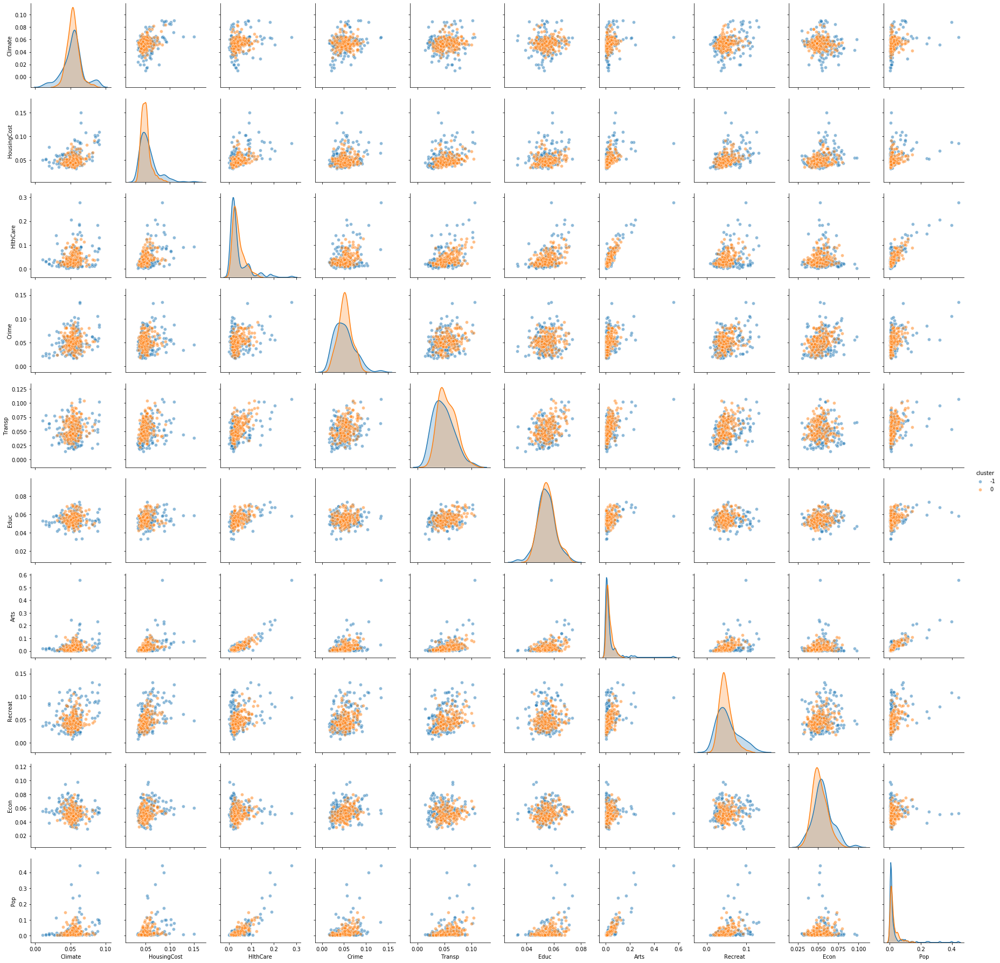

In [36]:
data_dbscan['cluster'] = cl_dbscan.labels_
sns.pairplot(data_dbscan,
             hue='cluster',
             plot_kws={'alpha':0.5},
             vars=list(data_new[:10]))
plt.show()

**Comment:** *Данное разделение я выбрала из-за минимального количества выбросов, которое однако все же составило более половины элементов датафрейма. Так как кластер всего один, а остально - выбросы, считаю данную кластеризацию нерепрезентативной.*

**Задание 3.**

Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.

In [4]:
from sklearn.cluster import KMeans

In [38]:
k_means = KMeans(n_clusters=4, max_iter=100, tol=0.001, random_state=None)
k_means.fit(data_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.001, verbose=0)

In [6]:
k_means.cluster_centers_

array([[5.70763636e+02, 8.73921818e+03, 1.64580000e+03, 1.08345455e+03,
        4.98214545e+03, 2.96627273e+03, 4.85027273e+03, 2.11307273e+03,
        5.70065455e+03, 7.98826782e+05],
       [6.40600000e+02, 1.09948000e+04, 5.61380000e+03, 1.62760000e+03,
        6.28460000e+03, 3.30200000e+03, 2.65634000e+04, 2.96900000e+03,
        5.08020000e+03, 6.20354820e+06],
       [5.21244898e+02, 7.96833878e+03, 8.16995918e+02, 8.87873469e+02,
        3.83010204e+03, 2.74152653e+03, 1.62086939e+03, 1.67434286e+03,
        5.44349796e+03, 2.04086343e+05],
       [6.22625000e+02, 1.07560000e+04, 2.97316667e+03, 1.28875000e+03,
        5.88754167e+03, 3.11537500e+03, 9.99775000e+03, 2.75175000e+03,
        6.05212500e+03, 1.95094175e+06]])

In [40]:
data_kmeans = data_norm.copy(deep=True)

centers_kmeans = np.zeros((4, 10))
centers_kmeans[:, 0:10] = k_means.cluster_centers_
centers_kmeans = pd.DataFrame(centers_kmeans, columns=data_kmeans.columns)

data_kmeans['Cluster'] = k_means.labels_.astype(str)

centers_kmeans['Cluster'] = np.array(['c0', 'c1', 'c2', 'c3']).astype(str)

centers_kmeans

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop,Cluster
0,0.057151,0.061814,0.065752,0.059819,0.063245,0.057896,0.053788,0.062799,0.056973,0.043341,c0
1,0.052050,0.049016,0.026664,0.047575,0.046701,0.053119,0.013810,0.044658,0.052974,0.011313,c1
2,0.067807,0.080751,0.222234,0.098458,0.085488,0.062694,0.344799,0.094718,0.051762,0.387851,c2
3,0.061821,0.067368,0.127996,0.067058,0.075846,0.063597,0.120992,0.073480,0.058327,0.131157,c3


In [8]:
data_kmeans = data_kmeans.append(centers_kmeans, ignore_index=True)
data_kmeans.head(15)

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop,Cluster
0,521.0,6200.0,237.0,923.0,4031.0,2757.0,996.0,1405.0,7633.0,110932.0,2
1,575.0,8138.0,1656.0,886.0,4883.0,2438.0,5564.0,2632.0,4350.0,660328.0,0
2,468.0,7339.0,618.0,970.0,2531.0,2560.0,237.0,859.0,5250.0,112402.0,2
3,476.0,7908.0,1431.0,610.0,6883.0,3399.0,4655.0,1617.0,5864.0,835880.0,0
4,659.0,8393.0,1853.0,1483.0,6558.0,3026.0,4496.0,2612.0,5727.0,419700.0,2
5,520.0,5819.0,640.0,727.0,2444.0,2972.0,334.0,1018.0,5254.0,135282.0,2
6,559.0,8288.0,621.0,514.0,2881.0,3144.0,2333.0,1117.0,5097.0,635481.0,0
7,537.0,6487.0,965.0,706.0,4975.0,2945.0,1487.0,1280.0,5795.0,268229.0,2
8,561.0,6191.0,432.0,399.0,4246.0,2778.0,256.0,1210.0,4230.0,136621.0,2
9,609.0,6546.0,669.0,1073.0,4902.0,2852.0,1235.0,1109.0,6241.0,173699.0,2


C:\Users\paxom\Anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\paxom\Anaconda3\lib\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


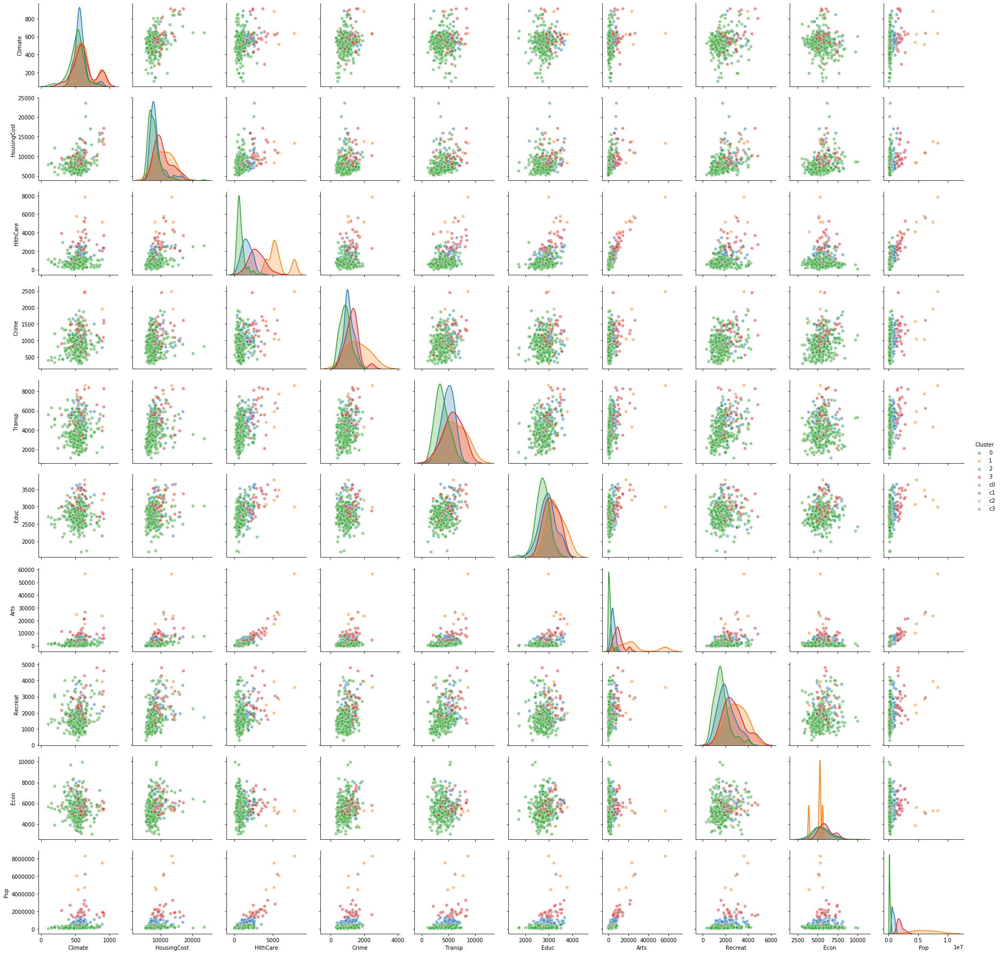

In [9]:
sns.pairplot(data_kmeans.sort_values('Cluster'), 
             hue='Cluster',
             plot_kws={'alpha':0.5})
plt.show()

**Comment:** *Кластеры хорошо различимы по сравнению с разбиением при помощи **DBSCAN**, четвертый кластер представлен гораздо меньше количественно.*

**Задание 4.**

In [45]:
k_medoids = KMedoids(n_clusters=4, distance='canberra')
k_medoids.fit(data_norm)

In [46]:
k_medoids.centers_

array([[0.05702204, 0.05122096, 0.0875602 , 0.05222299, 0.06666656,
        0.0607353 , 0.08427011, 0.06680362, 0.04941866, 0.05416793],
       [0.05492491, 0.04283023, 0.02781324, 0.04646824, 0.04328869,
        0.05443019, 0.01845345, 0.04438979, 0.05097554, 0.014736  ],
       [0.04863351, 0.05496853, 0.02894993, 0.03619575, 0.07291965,
        0.05553942, 0.0144598 , 0.04392454, 0.05740868, 0.00635572],
       [0.05192901, 0.03696116, 0.02273368, 0.03910002, 0.03026246,
        0.05783573, 0.00328542, 0.02785993, 0.05144554, 0.00721629]])

In [47]:
data_kmedoids = data_norm.copy(deep=True)

centers_kmedoids = np.zeros((4, 10))
centers_kmedoids[:, 0:10] = k_medoids.centers_
centers_kmedoids = pd.DataFrame(centers_kmedoids, columns=data_kmedoids.columns)

data_kmedoids['Cluster'] = k_medoids.labels_.astype(str)

centers_kmedoids['Cluster'] = np.array(['c0', 'c1', 'c2', 'c3']).astype(str)

centers_kmedoids

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop,Cluster
0,0.057022,0.051221,0.087560,0.052223,0.066667,0.060735,0.084270,0.066804,0.049419,0.054168,c0
1,0.054925,0.042830,0.027813,0.046468,0.043289,0.054430,0.018453,0.044390,0.050976,0.014736,c1
2,0.048634,0.054969,0.028950,0.036196,0.072920,0.055539,0.014460,0.043925,0.057409,0.006356,c2
3,0.051929,0.036961,0.022734,0.039100,0.030262,0.057836,0.003285,0.027860,0.051446,0.007216,c3


In [48]:
data_kmedoids = data_kmedoids.append(centers_kmedoids, ignore_index=True)
data_kmedoids.head(15)

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop,Cluster
0,0.052029,0.039381,0.008419,0.049641,0.049913,0.053652,0.009797,0.038451,0.074740,0.005917,1
1,0.057421,0.051691,0.058823,0.047651,0.060463,0.047444,0.054731,0.072031,0.042594,0.035224,1
2,0.046736,0.046616,0.021952,0.052169,0.031340,0.049818,0.002331,0.023509,0.051406,0.005996,1
3,0.047535,0.050230,0.050831,0.032807,0.085228,0.066145,0.045789,0.044253,0.057418,0.044588,2
4,0.065810,0.053311,0.065821,0.079760,0.081203,0.058887,0.044225,0.071483,0.056077,0.022388,0
5,0.051929,0.036961,0.022734,0.039100,0.030262,0.057836,0.003285,0.027860,0.051446,0.007216,3
6,0.055824,0.052644,0.022059,0.027644,0.035674,0.061183,0.022949,0.030569,0.049908,0.033898,3
7,0.053627,0.041204,0.034278,0.037971,0.061602,0.057310,0.014627,0.035030,0.056743,0.014308,2
8,0.056023,0.039324,0.015345,0.021459,0.052575,0.054060,0.002518,0.033114,0.041419,0.007288,1
9,0.060817,0.041579,0.023764,0.057709,0.060698,0.055501,0.012148,0.030350,0.061110,0.009266,1


C:\Users\paxom\Anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\paxom\Anaconda3\lib\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


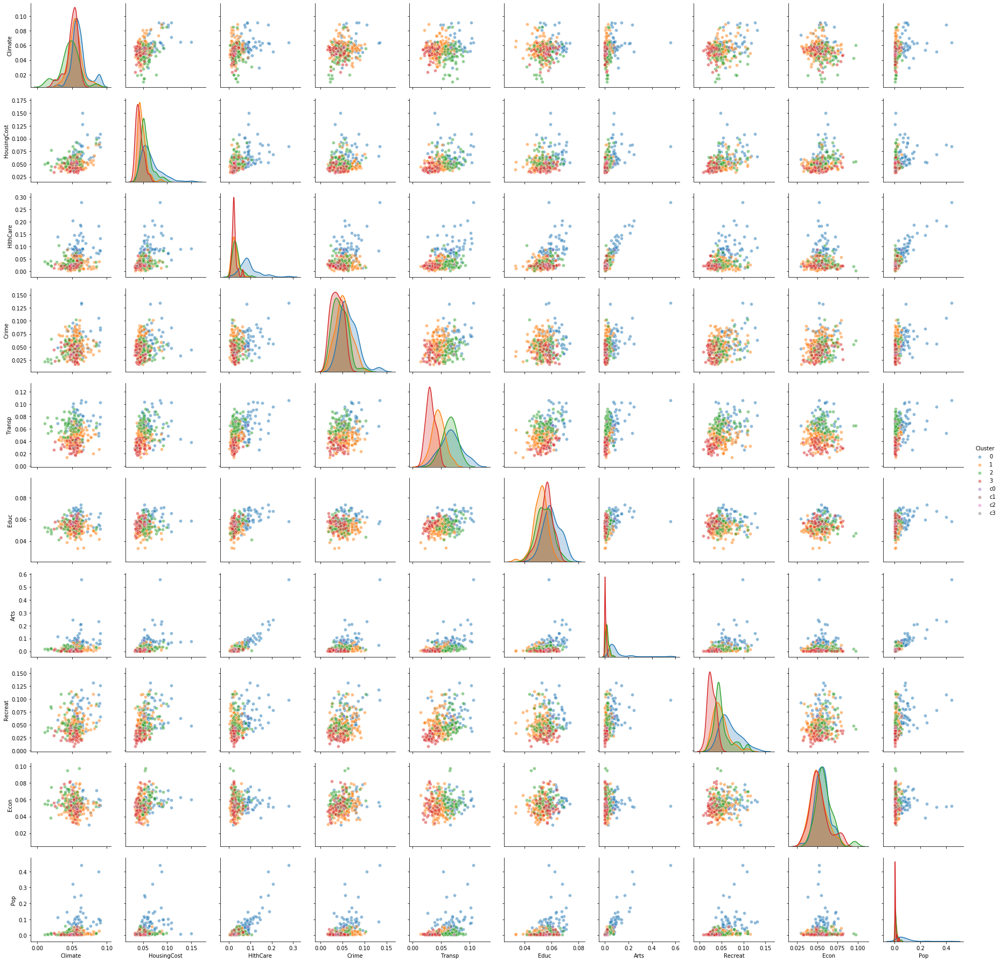

In [49]:
sns.pairplot(data_kmedoids.sort_values('Cluster'), 
             hue='Cluster', 
             plot_kws={'alpha':0.5})
plt.show()

**Comment:** *Все четыре кластера так же хорошо различимы по сравнению с разбиением при помощи **DBSCAN**.*

**Задание 5.**

(Бонусное) Выполните кластеризацию другими методами. Например, `HDBSCAN` или алгоритмы, реализованные в `scikit-learn`.

In [50]:
# import sys
# !conda install --yes --prefix {sys.prefix} hdbscan

In [51]:
import hdbscan

In [52]:
hdbscan.dist_metrics.METRIC_MAPPING

{'euclidean': hdbscan.dist_metrics.EuclideanDistance,
 'l2': hdbscan.dist_metrics.EuclideanDistance,
 'minkowski': hdbscan.dist_metrics.MinkowskiDistance,
 'p': hdbscan.dist_metrics.MinkowskiDistance,
 'manhattan': hdbscan.dist_metrics.ManhattanDistance,
 'cityblock': hdbscan.dist_metrics.ManhattanDistance,
 'l1': hdbscan.dist_metrics.ManhattanDistance,
 'chebyshev': hdbscan.dist_metrics.ChebyshevDistance,
 'infinity': hdbscan.dist_metrics.ChebyshevDistance,
 'seuclidean': hdbscan.dist_metrics.SEuclideanDistance,
 'mahalanobis': hdbscan.dist_metrics.MahalanobisDistance,
 'wminkowski': hdbscan.dist_metrics.WMinkowskiDistance,
 'hamming': hdbscan.dist_metrics.HammingDistance,
 'canberra': hdbscan.dist_metrics.CanberraDistance,
 'braycurtis': hdbscan.dist_metrics.BrayCurtisDistance,
 'matching': hdbscan.dist_metrics.MatchingDistance,
 'jaccard': hdbscan.dist_metrics.JaccardDistance,
 'dice': hdbscan.dist_metrics.DiceDistance,
 'kulsinski': hdbscan.dist_metrics.KulsinskiDistance,
 'rogerst

In [53]:
metrics_hdbscan = ['correlation', 'canberra', 'braycurtis', 'cityblock', 'euclidean', 'sqeuclidean']

In [54]:
values_list = []
max_len = 0

for metric in metrics_hdbscan:
    cl_hdbscan = hdbscan.HDBSCAN(min_cluster_size=5, gen_min_span_tree=True, metric=metric)
    cl_hdbscan.fit(data_norm)
    if max_len < len(pd.Series(cl_hdbscan.labels_).value_counts().tolist()):
        max_len = len(pd.Series(cl_hdbscan.labels_).value_counts().tolist())
    values_list.append([metric] + pd.Series(cl_hdbscan.labels_).value_counts().tolist())

pd.DataFrame(values_list, columns=['metric'] + list(np.arange(-1, max_len - 1)))

,metric,-1,0,1,2
0,correlation,271,38.0,20.0,NaN
1,canberra,302,15.0,7.0,5.0
2,braycurtis,309,11.0,9.0,NaN
3,cityblock,329,NaN,NaN,NaN
4,euclidean,329,NaN,NaN,NaN
5,sqeuclidean,329,NaN,NaN,NaN


In [55]:
cl_hdbscan = hdbscan.HDBSCAN(min_cluster_size=5, gen_min_span_tree=True, metric='correlation')
cl_hdbscan.fit(data_norm)

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_epsilon=0.0,
    cluster_selection_method='eom', core_dist_n_jobs=4,
    gen_min_span_tree=True, leaf_size=40,
    match_reference_implementation=False, memory=Memory(location=None),
    metric='correlation', min_cluster_size=5, min_samples=None, p=None,
    prediction_data=False)

In [56]:
pd.Series(cl_hdbscan.labels_).value_counts()

 0    271
-1    38 
 1    20 
dtype: int64

In [57]:
data_hdbscan = data_norm.copy(deep=True)

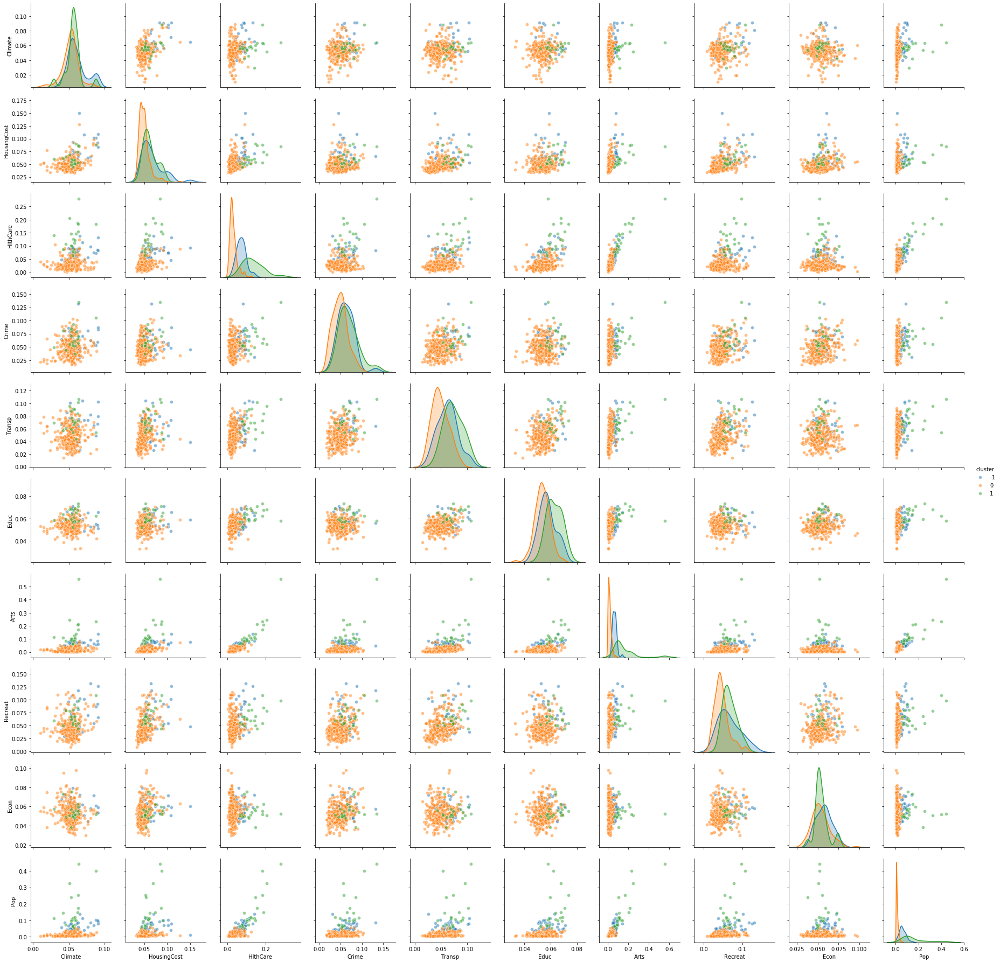

In [58]:
data_hdbscan['cluster'] = cl_hdbscan.labels_
sns.pairplot(data_hdbscan,
             hue='cluster',
             plot_kws={'alpha':0.5},
             vars=list(data_new[:10]))
plt.show()

**Comment:** *В целом, **HDBSCAN** представил результаты, похожие с **DBSCAN**. Детально их рассматривать я не вижу смысла.*

**Задание 6.**

В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиения объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).

**Comment:** *Разбиения, полученные при помощи **DBSCAN** и **HDBSCAN** не являются репрезентативными: кластеры четко не прослеживаются (либо как в первом случае он всего один), смешиваются между собой, поэтому невозможно уловить какую-либо зависимость между признаками. Лучше всего, я думаю, презентовал результаты метод **kmeans**: возможно отследить, как элементы кластеров "скучковались" друг с другом, образуя четкие кластерные группы. В целом, схожие результаты с **kmeans** продемонстрировали метод **kmedoids** и иерархический с помощью метода **complete** и метрики **canberra**, однако у них прослеживаются наложения кластеров. Остальные разделения, полученные иерархическим методом, из-за практически полного смешения нерепрезентативны.*

**Comment:** *На мой взгляд, удачной кластеризации не получилось из-за слишком близкого расстояния между объектами кластеров.*

**Задание 7.**

Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.

**Comment:** *По графику **kmeans** можно отчётливо отследить зависимость, например, между уровнем здравоохранения в каком-либо месте и ценами на жильё там (у них положительная зависимость), однако проследить отрицательную зависимость между ценами и уровнем преступности невозможно. Все объекты расположились таким образом, что вычленить какую-либо зависимость возможно лишь для некоторых из них, что уже может говорить о несовсем достоверной интерпретации, если её попытаться сделать.*

**Задание 8.** 

Оцените, как полученные кластеры распределены географически. (Бонусное) Провизуализируйте распределение на карте США.
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?

In [59]:
# import sys
# !{sys.executable} -m pip install folium

In [60]:
import folium

In [61]:
data_kmeans_map = data_kmeans.assign(Place=data.Place, 
                                     Longitude=data.Long, 
                                     Latitude=data.Lat)
data_kmeans_map.head(15)

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop,Cluster,Place,Longitude,Latitude
0,0.052029,0.039381,0.008419,0.049641,0.049913,0.053652,0.009797,0.038451,0.074740,0.005917,1,"Abilene,TX",-99.6890,32.55900
1,0.057421,0.051691,0.058823,0.047651,0.060463,0.047444,0.054731,0.072031,0.042594,0.035224,0,"Akron,OH",-81.5180,41.08500
2,0.046736,0.046616,0.021952,0.052169,0.031340,0.049818,0.002331,0.023509,0.051406,0.005996,1,"Albany,GA",-84.1580,31.57500
3,0.047535,0.050230,0.050831,0.032807,0.085228,0.066145,0.045789,0.044253,0.057418,0.044588,0,"Albany-Schenectady-Troy,NY",-73.7983,42.73270
4,0.065810,0.053311,0.065821,0.079760,0.081203,0.058887,0.044225,0.071483,0.056077,0.022388,0,"Albuquerque,NM",-106.6500,35.08300
5,0.051929,0.036961,0.022734,0.039100,0.030262,0.057836,0.003285,0.027860,0.051446,0.007216,1,"Alexandria,LA",-92.4530,31.30200
6,0.055824,0.052644,0.022059,0.027644,0.035674,0.061183,0.022949,0.030569,0.049908,0.033898,1,"Allentown,Bethlehem,PA-NJ",-75.4405,40.61550
7,0.053627,0.041204,0.034278,0.037971,0.061602,0.057310,0.014627,0.035030,0.056743,0.014308,1,"Alton,Granite-City,IL",-90.1615,38.79400
8,0.056023,0.039324,0.015345,0.021459,0.052575,0.054060,0.002518,0.033114,0.041419,0.007288,1,"Altoona,PA",-78.3950,40.51500
9,0.060817,0.041579,0.023764,0.057709,0.060698,0.055501,0.012148,0.030350,0.061110,0.009266,1,"Amarillo,TX",-101.8490,35.38300


In [62]:
data_kmeans_map_cl_0 = data_kmeans_map.loc[data_kmeans_map['Cluster'] == '0']
data_kmeans_map_cl_1 = data_kmeans_map.loc[data_kmeans_map['Cluster'] == '1']
data_kmeans_map_cl_2 = data_kmeans_map.loc[data_kmeans_map['Cluster'] == '2']
data_kmeans_map_cl_3 = data_kmeans_map.loc[data_kmeans_map['Cluster'] == '3']

In [63]:
m = folium.Map(
    location=[40, -97],
    zoom_start=4.4
)   

data_kmeans_map_cl_0.apply(
    lambda row: folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']], 
        radius=1.3,
        color='#EF3C51',
        popup=row['Place']).
    add_to(m), axis=1
)

data_kmeans_map_cl_1.apply(
    lambda row: folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']], 
        radius=1.3,
        color='#F9D23E',
        popup=row['Place']).
    add_to(m), axis=1
)

data_kmeans_map_cl_2.apply(
    lambda row: folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']], 
        radius=1.3,
        color='#4B3CAD',
        popup=row['Place']).
    add_to(m), axis=1
)

data_kmeans_map_cl_3.apply(
    lambda row: folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']], 
        radius=1.3,
        color='#55D235',
        popup=row['Place']).
    add_to(m), axis=1
)

    
m

**Comment:** *На мой взгляд, зависимость прослеживается лишь в том, что большинство адресов располагаются на восточной стороне государства. Но в целом элементы кластеров расположены по всей стране, практически в каждом штате можно найти хотя бы один из них.*